# Running SATURN

In [2]:
!pwd

/data/User/revolvefire/projects/1.ATAC_230519/250210_SATURN/SATURN/Vignettes/frog_zebrafish_embryogenesis


In [3]:
# Make the csv
import pandas as pd

df = pd.DataFrame(columns=["path", "species", "embedding_path"])
df["species"] = ["human", "mouse"]
df["path"] = ["250214.human.raw.fibroblast.subsampled.fineannot.withTimepoint.h5ad", "250214.mouse.raw.fibroblast.fineannot.withTimepoint.h5ad"] 

##### CHANGE THESE PATHS #####
human_embedding_path = "/data/User/revolvefire/projects/1.ATAC_230519/250210_SATURN/SATURN/protein_embeddings/ESM2/human_embedding.torch"
mouse_embedding_path = "/data/User/revolvefire/projects/1.ATAC_230519/250210_SATURN/SATURN/protein_embeddings/ESM2/mouse_embedding.torch"
##############################
df["embedding_path"] = [human_embedding_path, mouse_embedding_path]
df.to_csv("human_mouse_run-5.csv", index=False)
df

,path,species,embedding_path
0,250214.human.raw.fibroblast.subsampled.fineann...,human,/data/User/revolvefire/projects/1.ATAC_230519/...
1,250214.mouse.raw.fibroblast.fineannot.withTime...,mouse,/data/User/revolvefire/projects/1.ATAC_230519/...


# Train the Model

We can see `train-saturn.py`'s potential arguments with `--help`.

In [4]:
!python /data/User/revolvefire/projects/1.ATAC_230519/250210_SATURN/SATURN/train-saturn.py --help

usage: train-saturn.py [-h] [--in_data IN_DATA] [--device DEVICE]
                       [--device_num DEVICE_NUM] [--time_stamp TIME_STAMP] [--org ORG]
                       [--log_dir LOG_DIR] [--work_dir WORK_DIR] [--seed SEED]
                       [--in_label_col IN_LABEL_COL] [--ref_label_col REF_LABEL_COL]
                       [--tissue_subset TISSUE_SUBSET] [--tissue_column TISSUE_COLUMN]
                       [--hv_genes HV_GENES] [--hv_span HV_SPAN]
                       [--num_macrogenes NUM_MACROGENES]
                       [--centroids_init_path CENTROIDS_INIT_PATH]
                       [--embedding_model {ESM1b,MSA1b,protXL,ESM1b_protref,ESM2}]
                       [--centroid_score_func {default,one_hot,smoothed}] [--vae [VAE]]
                       [--hidden_dim HIDDEN_DIM] [--model_dim MODEL_DIM]
                       [--binarize_expression [BINARIZE_EXPRESSION]]
                       [--scale_expression [SCALE_EXPRESSION]] [--pretrain [PRETRAIN]]
       

In [6]:
!python ../../train-saturn.py --in_data='human_mouse_run-5.csv' \
                              --in_label_col='celltype' --ref_label_col='celltype' \
                              --num_macrogenes=2000     --hv_genes=8000          \
                              --centroids_init_path='saturn_results/mh_fine_fibroblast_centroids_250215.pkl' \
                              #--score_adata --ct_map_path='celltype_mapping.csv' \
                              --work_dir=. \
                              #--device_num=7 \

Using Device 0
Set seed to 0
Only considering the two last: ['.withTimepoint', '.h5ad'].
Only considering the two last: ['.withTimepoint', '.h5ad'].
Only considering the two last: ['.withTimepoint', '.h5ad'].
Only considering the two last: ['.withTimepoint', '.h5ad'].
After loading the anndata human View of AnnData object with n_obs × n_vars = 30716 × 19324
    obs: 'sanger_id', 'chemistry', 'donor', 'gender', 'pcw', 'sorting', 'sample', 'chemistry_sorting', 'index', 'doublet_scores', 'predicted_doublets', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'mt_outlier', 'QC', 'S_score', 'G2M_score', 'phase', 'joint_annotation_20220202', 'fig1b_annotation_v2', 'annotation_fine', 'annotation_verybroad', 'annotation_broad', 'cel

## Load SATURN Results

In [7]:
import scanpy as sc
import pickle

In [8]:
adata = sc.read("./out/saturn_results/test256_data_250214.human.raw.fibroblast.subsampled.fineannot.withTimepoint_250214.mouse.raw.fibroblast.fineannot.withTimepoint_org_saturn_seed_0.h5ad")
adata

Only considering the two last: ['.withTimepoint_org_saturn_seed_0', '.h5ad'].
Only considering the two last: ['.withTimepoint_org_saturn_seed_0', '.h5ad'].


AnnData object with n_obs × n_vars = 64819 × 256
    obs: 'labels', 'labels2', 'ref_labels', 'species'
    obsm: 'macrogenes'

## Visualize our integration

In [9]:
sc.pp.pca(adata)

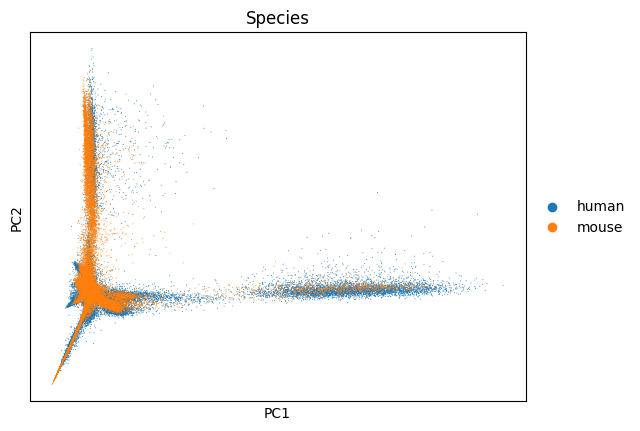

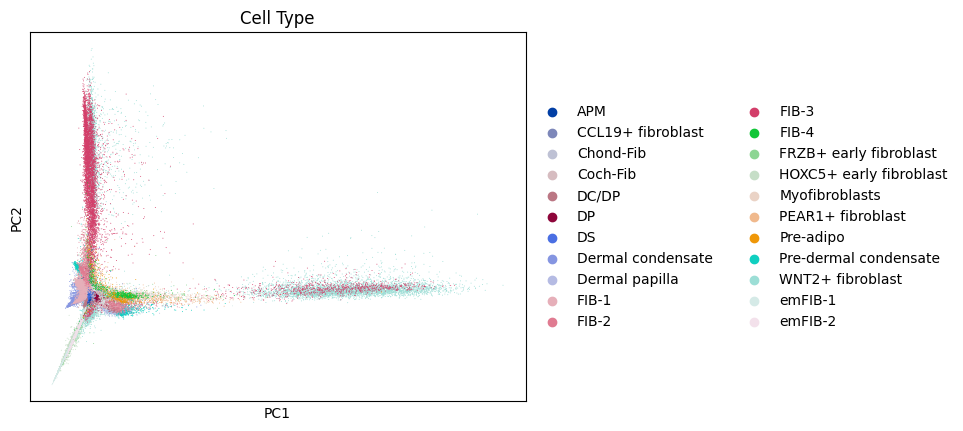

In [10]:
sc.pl.pca(adata, color="species", title="Species")
sc.pl.pca(adata, color="labels2", title="Cell Type") # The original cell type names

In [11]:
sc.pp.neighbors(adata)
sc.tl.umap(adata)

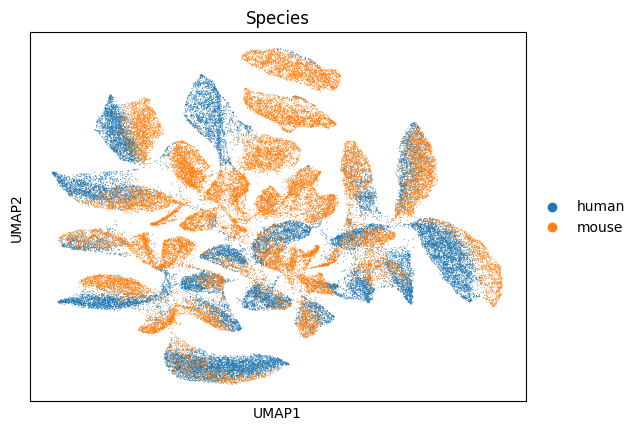

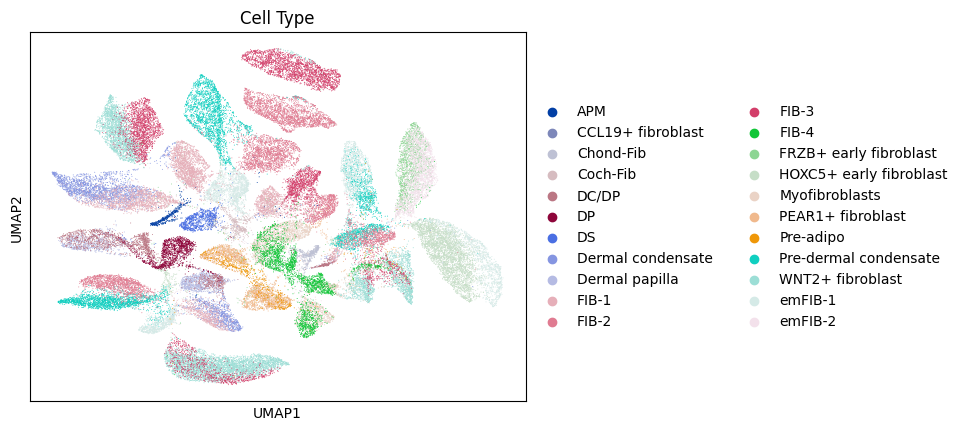

In [12]:
sc.pl.umap(adata, color="species", title="Species")
sc.pl.umap(adata, color="labels2", title="Cell Type")

In [11]:
sc.set_figure_params(dpi=300)#, facecolor='white')

In [14]:
adata

AnnData object with n_obs × n_vars = 64819 × 256
    obs: 'labels', 'labels2', 'ref_labels', 'species'
    uns: 'pca', 'species_colors', 'labels2_colors', 'neighbors', 'umap'
    obsm: 'macrogenes', 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [22]:
sc.set_figure_params(dpi=300)#, facecolor='white')

In [125]:
# Set global parameters
plt.rcParams['axes.grid'] = False
plt.rcParams.update({'xtick.labelsize': 5, 'ytick.labelsize': 7})

# Use the 'save' parameter to automatically save the figure.
# Note: The file will be saved in the current working directory (or in sc.settings.figdir if set)
sc.pl.correlation_matrix(adata, "labels", figsize=(15, 14),
                           show_correlation_numbers=False, 
                           save='250216.fibroblast.fine.correlation_matrix.svg')

In [50]:
mouse = sc.read("250213.mouse.raw.fibroblast.fineannot.h5ad") #pre-adipo in fibroblast
human = sc.read("250212.human.raw.h5ad")

Only considering the two last: ['.fineannot', '.h5ad'].
Only considering the two last: ['.fineannot', '.h5ad'].
Only considering the two last: ['.raw', '.h5ad'].
Only considering the two last: ['.raw', '.h5ad'].


In [51]:
mouse.obs['celltype']

AAACCTGAGCCAGTAG-1-0      emFIB-1
AAACCTGAGCTATGCT-1-0      emFIB-1
AAACCTGAGGAGTCTG-1-0      emFIB-2
AAACCTGGTTCATGGT-1-0      emFIB-2
AAACCTGTCCCGACTT-1-0      emFIB-1
                          ...    
TTTGGTTTCCGACAGC-1-9           DS
TTTGTTGCAACTGCCG-1-9        FIB-1
TTTGTTGCACTACTTT-1-9           DP
TTTGTTGGTATCATGC-1-9           DP
TTTGTTGTCAAAGGAT-1-9    Chond-Fib
Name: celltype, Length: 34103, dtype: category
Categories (13, object): ['APM', 'Chond-Fib', 'Coch-Fib', 'DC/DP', ..., 'FIB-4', 'Pre-adipo', 'emFIB-1', 'emFIB-2']

In [ ]:
import pandas as pd

mouse_time = mouse.obs[['bulk.ident']].copy()
mouse_time = mouse_time.rename(columns={'bulk.ident': 'timepoint'})

human_time = human.obs[['pcw']].copy()
human_time = human_time.rename(columns={'pcw': 'timepoint'})

time_mapping = pd.concat([mouse_time, human_time])

adata.obs['timepoint'] = time_mapping['timepoint'].reindex(adata.obs.index)

print(adata.obs[['timepoint']].head())

In [53]:
adata.obs['timepoint'] = pd.Categorical(adata.obs['timepoint'])

In [110]:
sc.tl.dendrogram(adata, groupby="timepoint", optimal_ordering=True)

In [146]:
plt.rcParams['axes.grid'] = False
plt.rcParams.update({'xtick.labelsize': 25, 'ytick.labelsize': 30})
sc.pl.correlation_matrix(adata, "timepoint", figsize=(15, 14),
                           show_correlation_numbers=False, cmap='Spectral',
                           save='250216.timepoint.fibroblast.correlation_matrix.spectral.svg')

In [ ]:
mouse_time = mouse.obs[['celltype']].copy()
mouse_time = mouse_time.rename(columns={'celltype': 'broad'})

human_time = human.obs[['annotation_fine']].copy()
human_time = human_time.rename(columns={'annotation_fine': 'broad'})

time_mapping = pd.concat([mouse_time, human_time])

adata.obs['broad'] = time_mapping['broad'].reindex(adata.obs.index)

print(adata.obs[['broad']].head())

In [69]:
adata.obs['broad'] = pd.Categorical(adata.obs['broad'])

In [70]:
sc.tl.dendrogram(adata, groupby="broad")

In [ ]:
adata.obs['broad'] = adata.obs['broad'].astype(str)

adata.obs.loc[adata.obs['species'] == 'human', 'broad'] = (
    'Human_' + adata.obs.loc[adata.obs['species'] == 'human', 'broad']
)

adata.obs.loc[adata.obs['species'] == 'mouse', 'broad'] = (
    'Mouse_' + adata.obs.loc[adata.obs['species'] == 'mouse', 'broad']
)

adata.obs['broad'] = pd.Categorical(adata.obs['broad'])

print(adata.obs[['species', 'broad']].head())

In [73]:
sc.tl.dendrogram(adata, n_pcs=50,  groupby="broad", optimal_ordering=True)

In [93]:
import scanpy as sc
sc.set_figure_params(dpi=300)#, facecolor='white')

In [126]:
plt.rcParams['axes.grid'] = False
plt.rcParams.update({'xtick.labelsize': 20, 'ytick.labelsize': 20})

sc.pl.correlation_matrix(adata, "broad", figsize=(15, 14),
                           show_correlation_numbers=False, cmap='Spectral_r',
                           save='250216.broad.fibroblast.correlation_matrix.svg')

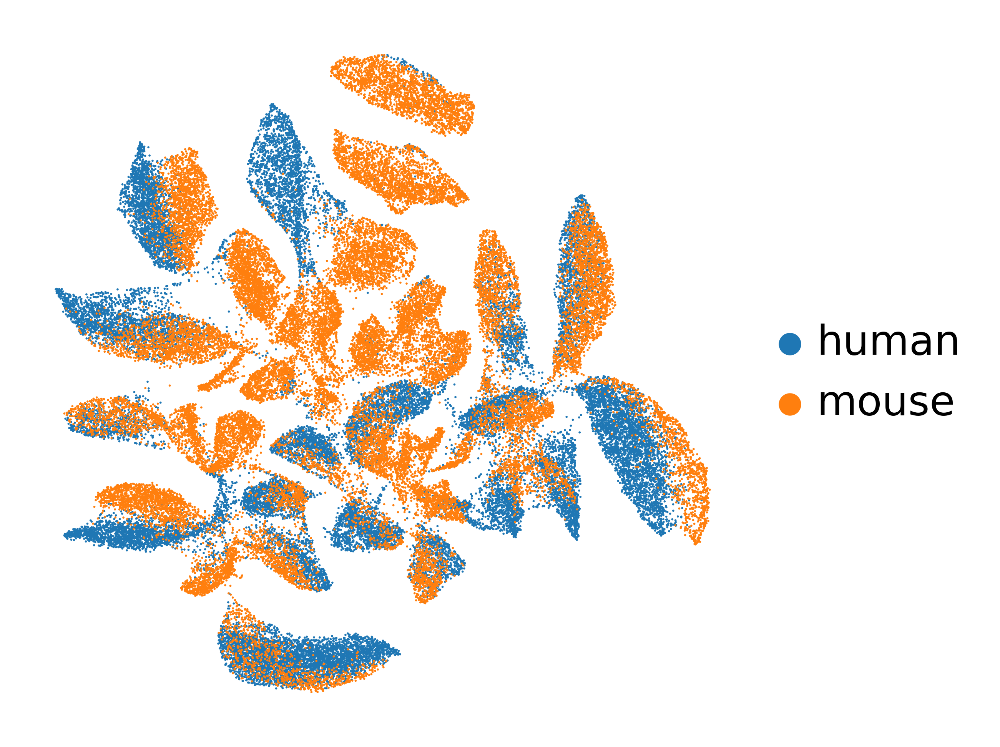

In [121]:
sc.pl.umap(adata, title="", color="species", frameon=False, legend_loc='right margin', save="250216.species.fibroblast.umap.svg")

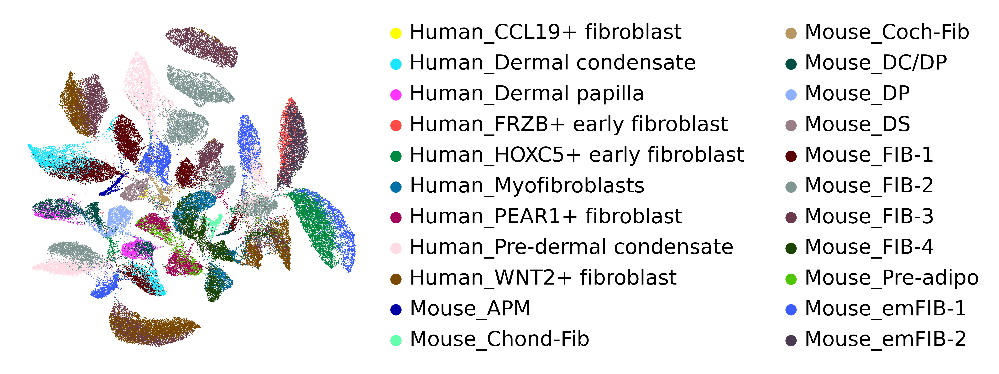

In [122]:
sc.pl.umap(adata, color="broad", title="", palette=sc.pl.palettes.default_102, frameon=False, legend_loc='right margin', save="250216.fibroblast.umap.svg")

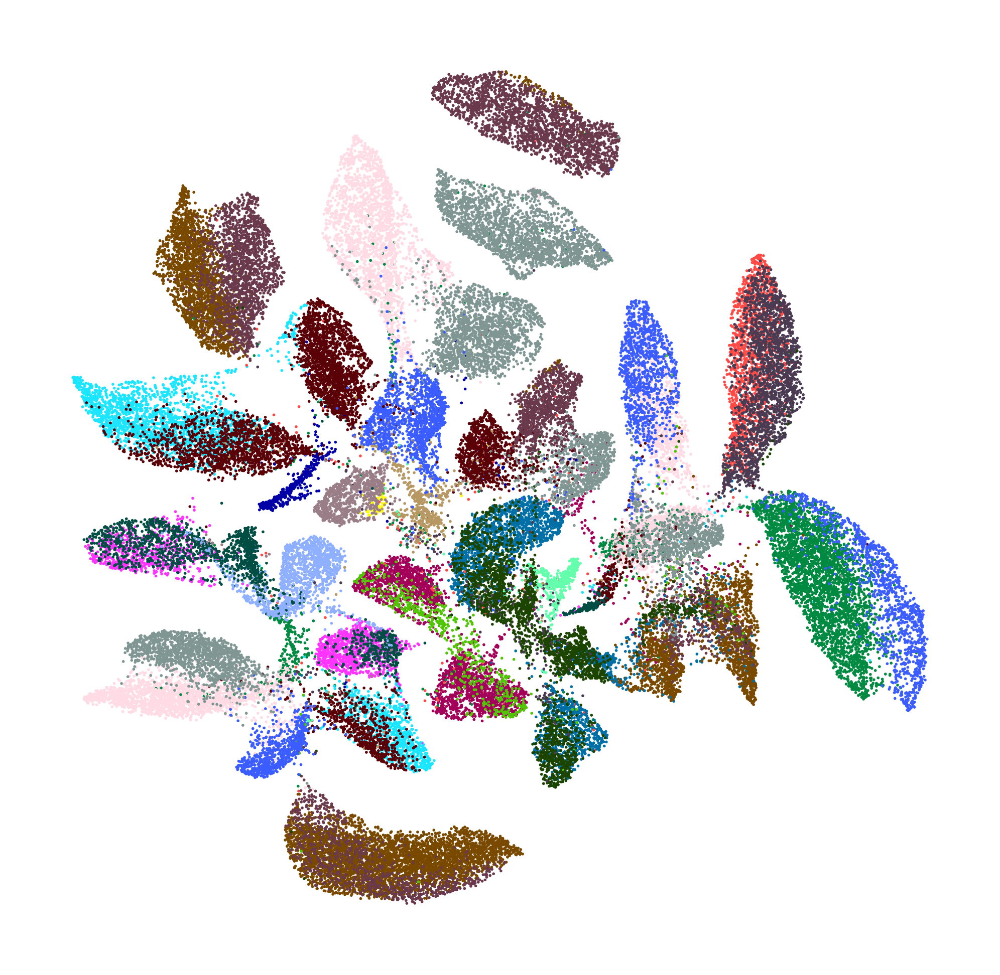

In [123]:
sc.pl.umap(adata, color="broad", title="", palette=sc.pl.palettes.default_102, frameon=False, add_outline=False, legend_loc='none', save="250216.fibroblast.umap.nolegend.svg")